In [1]:
import os
import sys
sys.path.append(os.path.abspath('../../Dynamic_AMM'))
from env.amm import AMM
from env.oracle import OracleSimulator
from env.trader import Arbitrager

In [1]:
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Read data
df = pl.read_csv('/home/shiftpub/Dynamic_AMM/results/simulation_results_20241203_155520/final_results.csv')


In [ ]:
import polars as pl
import plotly.graph_objects as go

def create_single_heatmap(df, metric):
    """
    Create a single heatmap for the given metric
    """
    # Create pivot table
    pivot = (df
        .pivot(
            values=metric,
            index='sigma',
            columns='fee_rate',
            aggregate_function='mean'
        )
        .sort('sigma')
    )
    
    # Convert to numpy arrays for heatmap
    sigma_values = pivot.get_column('sigma').to_numpy()
    fee_rate_values = [float(col) for col in pivot.columns[1:]]
    z_values = pivot.select(pivot.columns[1:]).to_numpy()
    
    # Create figure
    fig = go.Figure()
    
    # Add heatmap trace
    fig.add_trace(
        go.Heatmap(
            z=z_values,
            x=fee_rate_values,
            y=sigma_values,
            colorscale='RdBu',
        )
    )
    
    # Update layout
    fig.update_layout(
        title=f'{metric} Analysis',
        xaxis_title="Fee Rate",
        yaxis_title="Sigma",
        width=800,
        height=600,
        coloraxis_colorbar=dict(
            title=metric,
            titleside='right'
        )
    )
    
    return fig

# Read the data
df = pl.read_parquet('/home/shiftpub/Dynamic_AMM/results/simulation_results_20241203_205259/final_results.parquet')

# Define metrics
metrics = ['total_fee_dollar_value', 'trader_total_pnl', 'impermanent_loss', 'net_profit']

# Create and show separate plots for each metric
for metric in metrics:
    fig = create_single_heatmap(df, metric)
    fig.show()

/tmp/ipykernel_869326/841744661.py:21: DeprecationWarning:

The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.



In [15]:
print(df.columns)

['sigma', 'fee_rate', 'fee_source', 'seed', 'total_fee_dollar_value', 'trader_total_pnl', 'impermanent_loss', 'net_profit', 'total_number_trade', 'account_profit']


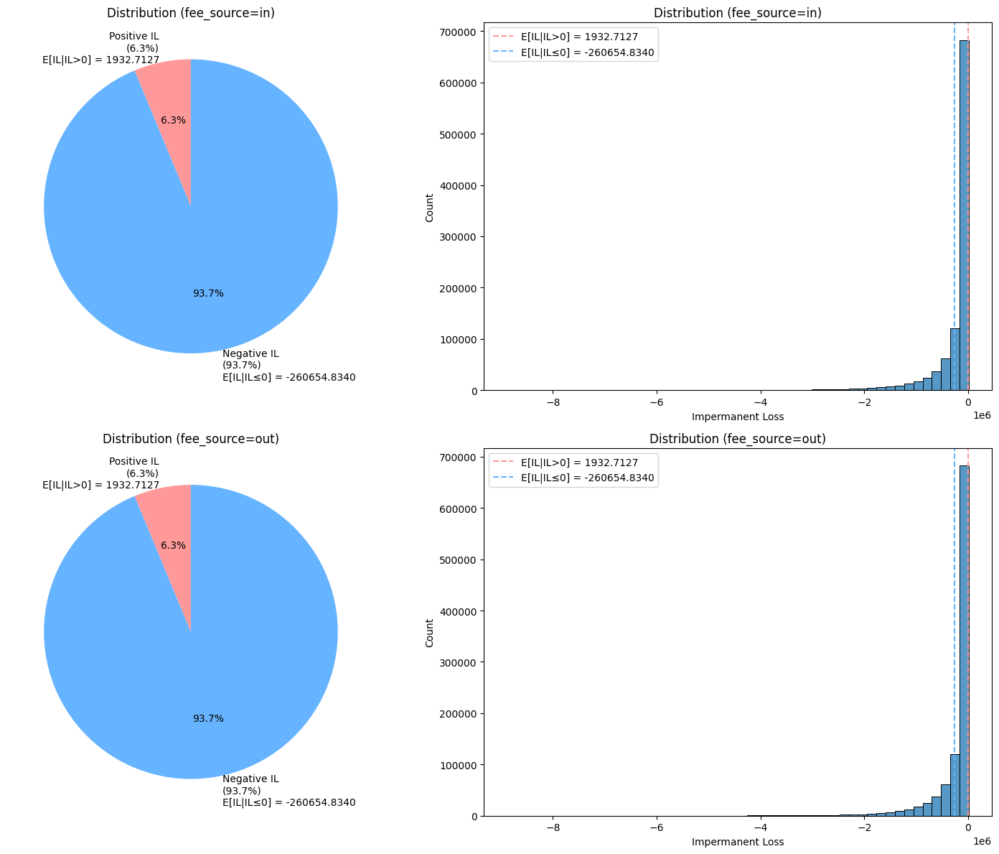

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_impermanent_loss_split(df):
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    for idx, source in enumerate(['in', 'out']):
        source_data = df.filter(pl.col('fee_source') == source)
        positive_il = (source_data['impermanent_loss'] > 0).sum()
        total = len(source_data)
        positive_pct = (positive_il / total) * 100
        negative_pct = 100 - positive_pct
        
        ce_positive = source_data.filter(pl.col('impermanent_loss') > 0)['impermanent_loss'].mean()
        ce_negative = source_data.filter(pl.col('impermanent_loss') <= 0)['impermanent_loss'].mean()
        
        # Pie chart
        colors = ['#ff9999', '#66b3ff']
        axes[idx, 0].pie([positive_pct, negative_pct], 
                        labels=[f'Positive IL\n({positive_pct:.1f}%)\nE[IL|IL>0] = {ce_positive:.4f}', 
                               f'Negative IL\n({negative_pct:.1f}%)\nE[IL|IL≤0] = {ce_negative:.4f}'],
                        colors=colors,
                        autopct='%1.1f%%',
                        startangle=90)
        axes[idx, 0].set_title(f'Distribution (fee_source={source})')
        
        # Histogram
        sns.histplot(data=source_data, x='impermanent_loss', bins=50, ax=axes[idx, 1])
        axes[idx, 1].axvline(x=ce_positive, color='#ff9999', linestyle='--', 
                            label=f'E[IL|IL>0] = {ce_positive:.4f}')
        axes[idx, 1].axvline(x=ce_negative, color='#66b3ff', linestyle='--', 
                            label=f'E[IL|IL≤0] = {ce_negative:.4f}')
        axes[idx, 1].set_title(f'Distribution (fee_source={source})')
        axes[idx, 1].set_xlabel('Impermanent Loss')
        axes[idx, 1].set_ylabel('Count')
        axes[idx, 1].legend()
    
    plt.tight_layout()
    return plt

plot_impermanent_loss_split(df)
plt.show()

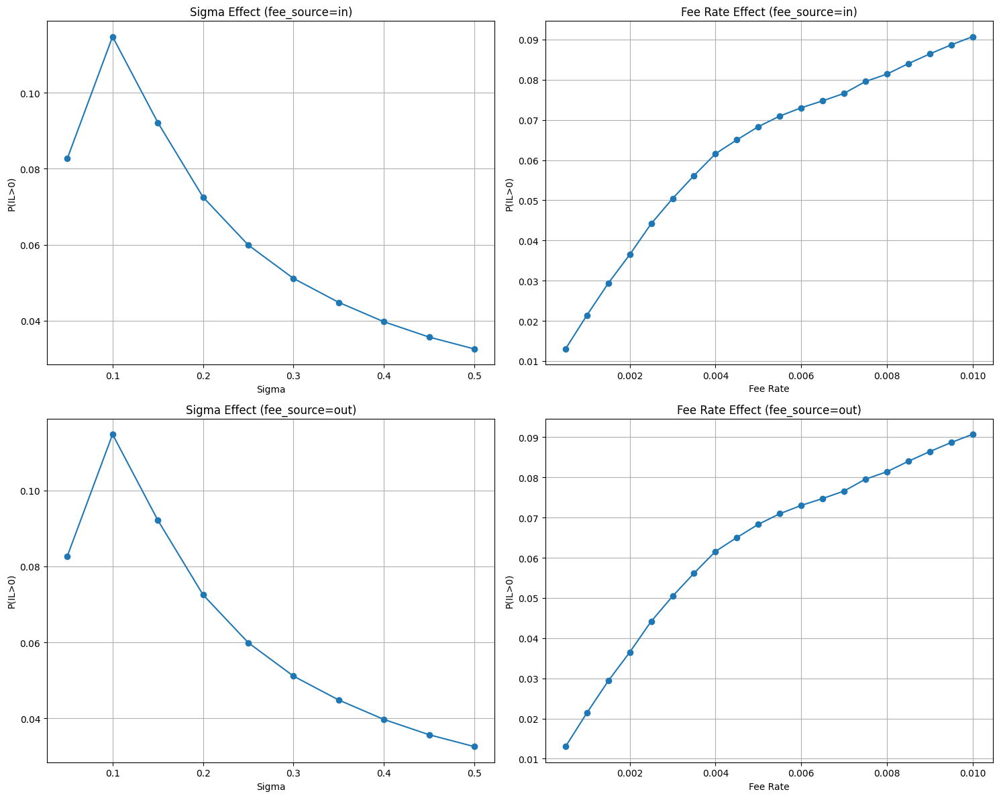

In [13]:
def plot_effect_size(df):
    df_stats = df.with_columns(pl.col('impermanent_loss').gt(0).alias('il_positive'))
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    for source, ax_sigma, ax_fee in [('in', ax1, ax2), ('out', ax3, ax4)]:
        source_data = df_stats.filter(pl.col('fee_source') == source)
        
        # Effect by sigma
        sigma_effect = source_data.group_by('sigma').agg(
            pl.mean('il_positive').alias('prob_il_positive')
        ).sort('sigma')
        
        ax_sigma.plot(sigma_effect['sigma'], sigma_effect['prob_il_positive'], marker='o')
        ax_sigma.set_title(f'Sigma Effect (fee_source={source})')
        ax_sigma.set_xlabel('Sigma')
        ax_sigma.set_ylabel('P(IL>0)')
        ax_sigma.grid(True)
        
        # Effect by fee rate
        fee_effect = source_data.group_by('fee_rate').agg(
            pl.mean('il_positive').alias('prob_il_positive')
        ).sort('fee_rate')
        
        ax_fee.plot(fee_effect['fee_rate'], fee_effect['prob_il_positive'], marker='o')
        ax_fee.set_title(f'Fee Rate Effect (fee_source={source})')
        ax_fee.set_xlabel('Fee Rate')
        ax_fee.set_ylabel('P(IL>0)')
        ax_fee.grid(True)
    
    plt.tight_layout()
    return plt

plot_effect_size(df)
plt.show()

/tmp/ipykernel_840269/531712923.py:25: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_840269/531712923.py:25: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



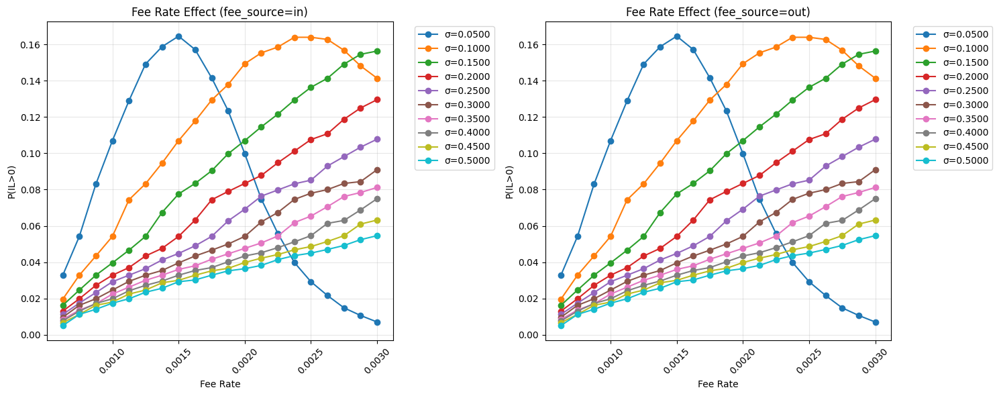

In [16]:
def plot_il_probability_lines(df):
    df_stats = df.with_columns(pl.col('impermanent_loss').gt(0).alias('il_positive'))
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    for source, ax in [('in', ax1), ('out', ax2)]:
        source_data = df_stats.filter(pl.col('fee_source') == source)
        
        for sigma in source_data['sigma'].unique().sort():
            sigma_data = source_data.filter(pl.col('sigma') == sigma)
            fee_effect = sigma_data.group_by('fee_rate').agg(
                pl.mean('il_positive').alias('prob_il_positive')
            ).sort('fee_rate')
            
            ax.plot(fee_effect['fee_rate'], 
                   fee_effect['prob_il_positive'], 
                   label=f'σ={sigma:.4f}',
                   marker='o')
            
        ax.set_title(f'Fee Rate Effect (fee_source={source})')
        ax.set_xlabel('Fee Rate')
        ax.set_ylabel('P(IL>0)')
        ax.grid(True, alpha=0.3)
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.set_xticklabels([f'{x:.4f}' for x in fee_effect['fee_rate']], rotation=45)
    
    plt.tight_layout()
    return plt

plot_il_probability_lines(df)
plt.show()

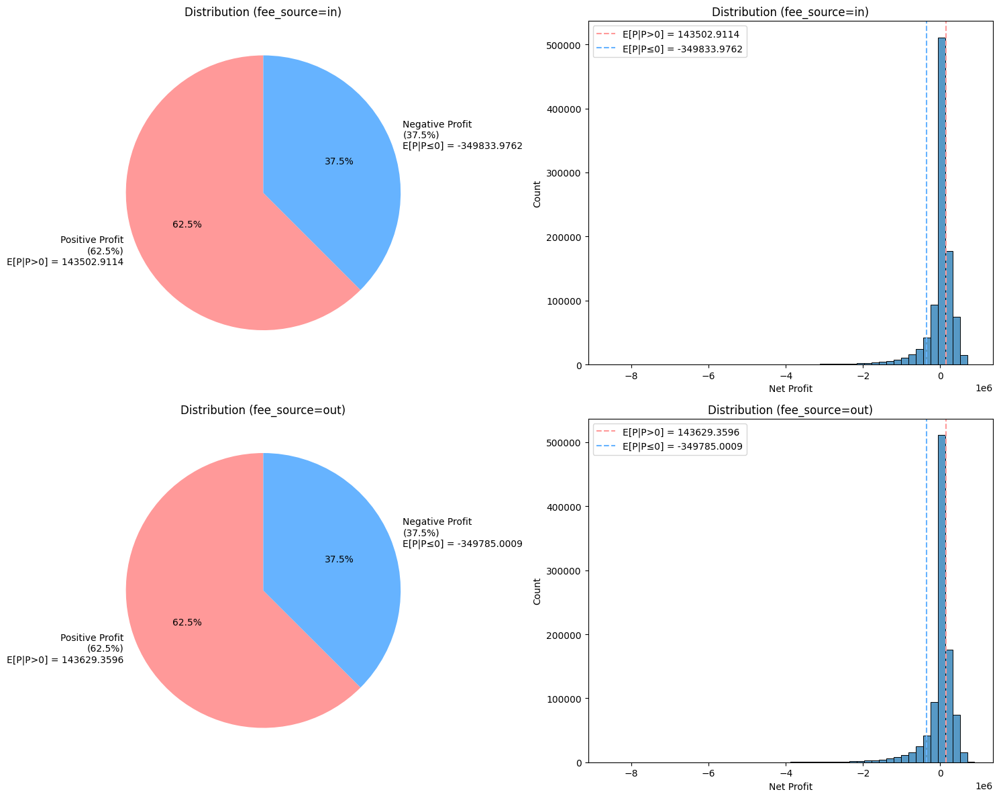

In [3]:
def plot_profit_split(df):
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    for idx, source in enumerate(['in', 'out']):
        source_data = df.filter(pl.col('fee_source') == source)
        positive_profit = (source_data['net_profit'] > 0).sum()
        total = len(source_data)
        positive_pct = (positive_profit / total) * 100
        negative_pct = 100 - positive_pct
        
        ce_positive = source_data.filter(pl.col('net_profit') > 0)['net_profit'].mean()
        ce_negative = source_data.filter(pl.col('net_profit') <= 0)['net_profit'].mean()
        
        colors = ['#ff9999', '#66b3ff']
        axes[idx, 0].pie([positive_pct, negative_pct], 
                        labels=[f'Positive Profit\n({positive_pct:.1f}%)\nE[P|P>0] = {ce_positive:.4f}', 
                               f'Negative Profit\n({negative_pct:.1f}%)\nE[P|P≤0] = {ce_negative:.4f}'],
                        colors=colors,
                        autopct='%1.1f%%',
                        startangle=90)
        axes[idx, 0].set_title(f'Distribution (fee_source={source})')
        
        sns.histplot(data=source_data, x='net_profit', bins=50, ax=axes[idx, 1])
        axes[idx, 1].axvline(x=ce_positive, color='#ff9999', linestyle='--', 
                            label=f'E[P|P>0] = {ce_positive:.4f}')
        axes[idx, 1].axvline(x=ce_negative, color='#66b3ff', linestyle='--', 
                            label=f'E[P|P≤0] = {ce_negative:.4f}')
        axes[idx, 1].set_title(f'Distribution (fee_source={source})')
        axes[idx, 1].set_xlabel('Net Profit')
        axes[idx, 1].set_ylabel('Count')
        axes[idx, 1].legend()
    
    plt.tight_layout()
    return plt

plot_profit_split(df)
plt.show()

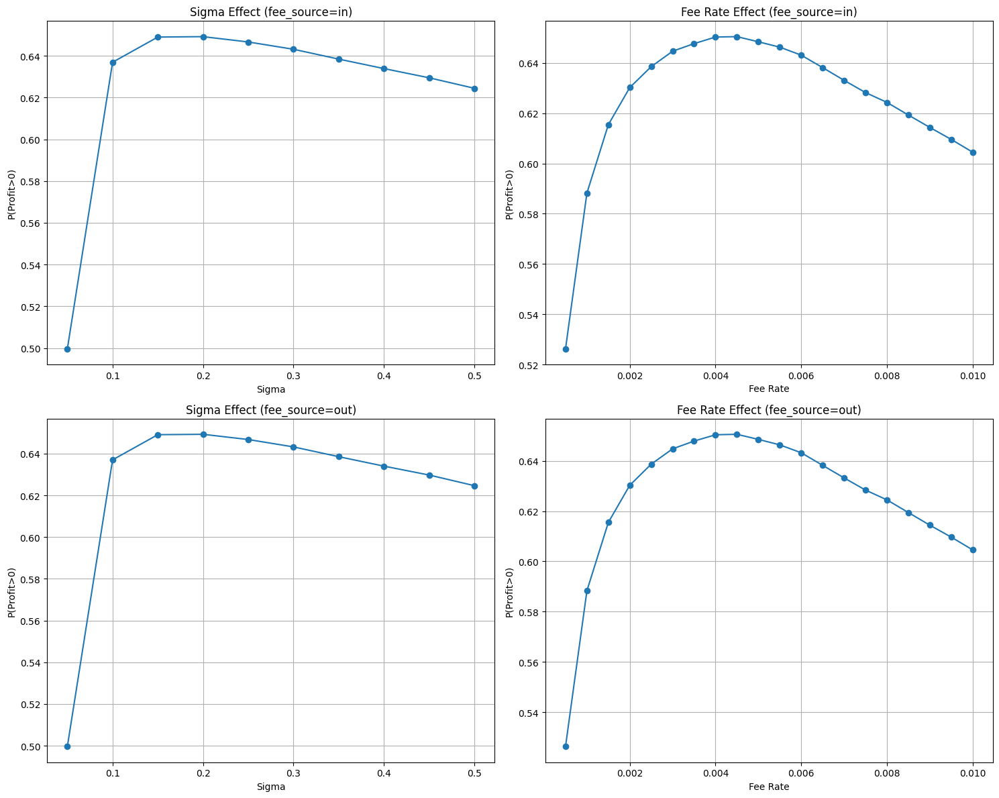

/tmp/ipykernel_840269/4146263578.py:56: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_840269/4146263578.py:56: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



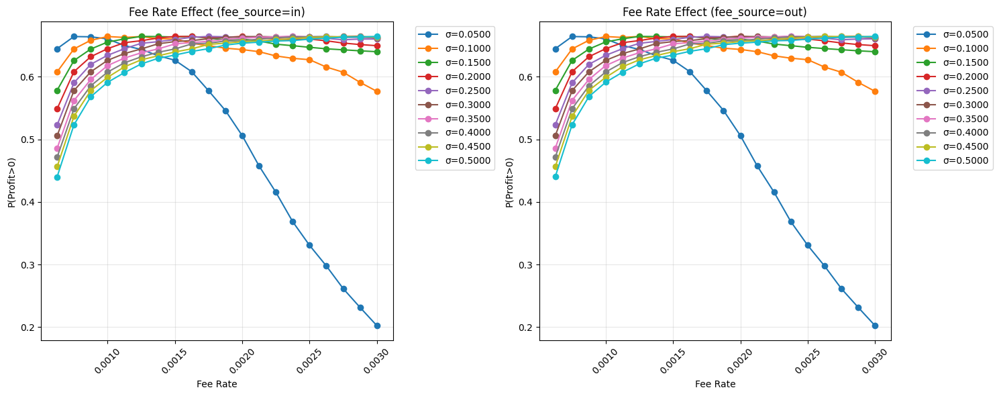

In [19]:
def plot_profit_effect_size(df):
    df_stats = df.with_columns(pl.col('net_profit').gt(0).alias('profit_positive'))
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    for source, ax_sigma, ax_fee in [('in', ax1, ax2), ('out', ax3, ax4)]:
        source_data = df_stats.filter(pl.col('fee_source') == source)
        
        sigma_effect = source_data.group_by('sigma').agg(
            pl.mean('profit_positive').alias('prob_profit_positive')
        ).sort('sigma')
        
        ax_sigma.plot(sigma_effect['sigma'], sigma_effect['prob_profit_positive'], marker='o')
        ax_sigma.set_title(f'Sigma Effect (fee_source={source})')
        ax_sigma.set_xlabel('Sigma')
        ax_sigma.set_ylabel('P(Profit>0)')
        ax_sigma.grid(True)
        
        fee_effect = source_data.group_by('fee_rate').agg(
            pl.mean('profit_positive').alias('prob_profit_positive')
        ).sort('fee_rate')
        
        ax_fee.plot(fee_effect['fee_rate'], fee_effect['prob_profit_positive'], marker='o')
        ax_fee.set_title(f'Fee Rate Effect (fee_source={source})')
        ax_fee.set_xlabel('Fee Rate')
        ax_fee.set_ylabel('P(Profit>0)')
        ax_fee.grid(True)
    
    plt.tight_layout()
    return plt

def plot_profit_probability_lines(df):
    df_stats = df.with_columns(pl.col('net_profit').gt(0).alias('profit_positive'))
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    for source, ax in [('in', ax1), ('out', ax2)]:
        source_data = df_stats.filter(pl.col('fee_source') == source)
        
        for sigma in source_data['sigma'].unique().sort():
            sigma_data = source_data.filter(pl.col('sigma') == sigma)
            fee_effect = sigma_data.group_by('fee_rate').agg(
                pl.mean('profit_positive').alias('prob_profit_positive')
            ).sort('fee_rate')
            
            ax.plot(fee_effect['fee_rate'], 
                   fee_effect['prob_profit_positive'], 
                   label=f'σ={sigma:.4f}',
                   marker='o')
            
        ax.set_title(f'Fee Rate Effect (fee_source={source})')
        ax.set_xlabel('Fee Rate')
        ax.set_ylabel('P(Profit>0)')
        ax.grid(True, alpha=0.3)
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.set_xticklabels([f'{x:.4f}' for x in fee_effect['fee_rate']], rotation=45)
    
    plt.tight_layout()
    return plt

plot_profit_effect_size(df)
plt.show()
plot_profit_probability_lines(df)
plt.show()

/tmp/ipykernel_839544/3463962153.py:6: DeprecationWarning: The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.
  metrics = (df.group_by(['seed', 'fee_rate', 'sigma', 'fee_source'])


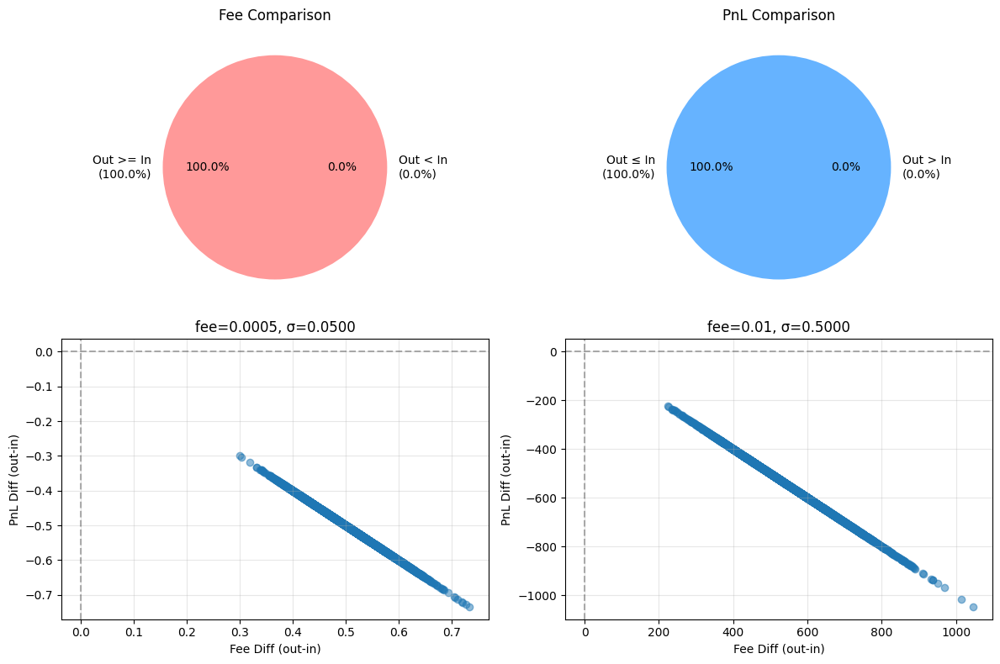

In [11]:
def plot_two_cases_analysis(df):
    fee_rates = df['fee_rate'].unique().sort()
    sigmas = df['sigma'].unique().sort()
    combinations = [(fee_rates[0], sigmas[0]), (fee_rates[-1], sigmas[-1])]
    
    metrics = (df.group_by(['seed', 'fee_rate', 'sigma', 'fee_source'])
                .agg([pl.mean('total_fee_dollar_value').alias('fee'),
                     pl.mean('trader_total_pnl').alias('pnl')])
                .pivot(values=['fee', 'pnl'], 
                      index=['seed', 'fee_rate', 'sigma'], 
                      columns='fee_source'))
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    
    data = metrics.filter((pl.col('fee_rate') == combinations[0][0]) & 
                         (pl.col('sigma') == combinations[0][1]))
    
    # Fee pie
    fee_higher = (data['fee_out'] >= data['fee_in']).sum()
    fee_pcts = [fee_higher/len(data)*100, (len(data)-fee_higher)/len(data)*100]
    axes[0, 0].pie(fee_pcts, 
                labels=[f'Out >= In\n({fee_pcts[0]:.1f}%)', 
                       f'Out < In\n({fee_pcts[1]:.1f}%)'],
                colors=['#ff9999', '#66b3ff'],
                autopct='%1.1f%%')
    axes[0, 0].set_title('Fee Comparison')
    
    # PnL pie
    pnl_higher = (data['pnl_out'] > data['pnl_in']).sum()
    pnl_pcts = [(len(data)-pnl_higher)/len(data)*100, pnl_higher/len(data)*100]  # Swapped order
    axes[0, 1].pie(pnl_pcts, 
                labels=[f'Out ≤ In\n({pnl_pcts[0]:.1f}%)', 
                       f'Out > In\n({pnl_pcts[1]:.1f}%)'],
                colors=['#66b3ff', '#ff9999'],  # Swapped colors
                autopct='%1.1f%%')
    axes[0, 1].set_title('PnL Comparison')
    
    # Scatter plots
    for idx, (fee, sigma) in enumerate(combinations):
        data = metrics.filter((pl.col('fee_rate') == fee) & (pl.col('sigma') == sigma))
        axes[1, idx].scatter(data['fee_out'] - data['fee_in'],
                           data['pnl_out'] - data['pnl_in'],
                           alpha=0.5)
        axes[1, idx].axhline(y=0, color='k', linestyle='--', alpha=0.3)
        axes[1, idx].axvline(x=0, color='k', linestyle='--', alpha=0.3)
        axes[1, idx].set_title(f'fee={fee}, σ={sigma:.4f}')
        axes[1, idx].set_xlabel('Fee Diff (out-in)')
        axes[1, idx].set_ylabel('PnL Diff (out-in)')
        axes[1, idx].grid(True, alpha=0.3)
    
    plt.tight_layout()
    return plt

plot_two_cases_analysis(df)
plt.show()

In [2]:
def plot_normalized_fee_heatmaps(df):
    pivot_in = (df
        .filter(pl.col('fee_source') == 'in')
        .pivot(
            values='total_fee_dollar_value',
            index='sigma',
            columns='fee_rate',
            aggregate_function='mean'
        )
        .sort('sigma')
    )
    
    pivot_out = (df
        .filter(pl.col('fee_source') == 'out')
        .pivot(
            values='total_fee_dollar_value',
            index='sigma',
            columns='fee_rate',
            aggregate_function='mean'
        )
        .sort('sigma')
    )
    
    sigma_values = pivot_in.get_column('sigma').to_numpy()
    fee_rate_values = [float(col) for col in pivot_in.columns[1:]]
    
    z_in = pivot_in.select(pivot_in.columns[1:]).to_numpy()
    z_out = pivot_out.select(pivot_out.columns[1:]).to_numpy()
    
    # Row normalization
    z_in_norm = (z_in - z_in.min(axis=1)[:, None]) / (z_in.max(axis=1) - z_in.min(axis=1))[:, None]
    z_out_norm = (z_out - z_out.min(axis=1)[:, None]) / (z_out.max(axis=1) - z_out.min(axis=1))[:, None]
    
    fig = make_subplots(rows=1, cols=2, subplot_titles=('Ingoing (Row Normalized)', 'Outgoing (Row Normalized)'))
    
    fig.add_trace(go.Heatmap(z=z_in_norm, x=fee_rate_values, y=sigma_values, coloraxis='coloraxis'), row=1, col=1)
    fig.add_trace(go.Heatmap(z=z_out_norm, x=fee_rate_values, y=sigma_values, coloraxis='coloraxis'), row=1, col=2)
    
    fig.update_layout(
        title='Fee Dollar Value (Row Normalized)',
        coloraxis=dict(
            colorscale='Viridis',
            colorbar=dict(
                title="Normalized Value",
                titleside='right'
            )
        ),
        width=1000,
        height=500,
        xaxis2_title="Fee Rate",
        yaxis_title="Sigma"
    )
    
    return fig

fig = plot_normalized_fee_heatmaps(df)
fig.show()

/tmp/ipykernel_840269/1624367485.py:2: DeprecationWarning: The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.
  pivot_in = (df
/tmp/ipykernel_840269/1624367485.py:13: DeprecationWarning: The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.
  pivot_out = (df
